# 第十章 图像分割

#### 孤立点检测

In [1]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt


In [2]:
laplaceKernel = np.array([[1,1,1],
                          [1,-8,1],
                          [1,1,1]])

filePath = 'E:\\dataImag\\DIP3E_Original_Images_CH10\\'

In [3]:
def filterProcess(img, kernel):
    #自定义卷积操作
    return cv.filter2D(img, -1, kernel)

In [4]:
def testPointDetection(name):
    
    img = cv.imread(filePath + name,0)

    result = filterProcess(img, laplaceKernel)
#    result = cv.Laplacian(img, -1,ksize=3,scale=1, delta=0, borderType=cv.BORDER_DEFAULT)
    plt.subplot(1,2,1)
    plt.imshow(img, cmap='gray')
    plt.subplot(1,2,2)
    plt.imshow(result, cmap='gray')
    
    plt.show()


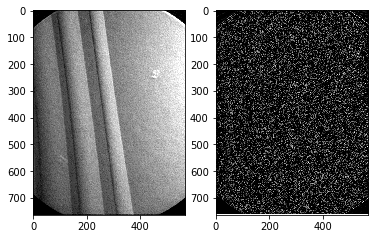

In [5]:
testPointDetection( 'Fig1004(b)(turbine_blade_black_dot).tif')

用拉普拉斯算子检测图像的孤立点，检测书中提供的，带有一个通孔的涡轮叶片的X射线图像，涡轮叶片上有一个黑色像素，我尝试了用自己写的，中心为-8的laplace模板和opencv提供的Laplacian函数，结果是一样的。实际上，如果不放大的话，是看不到我们检测到的点的，因此下面我又使用lena图作为测试图片。

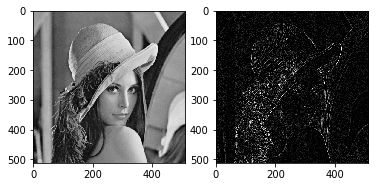

In [6]:
testPointDetection( 'lena_std.tif')

#### 线检测

In [7]:
def testLineDetection(name):
    img = cv.imread(filePath + name, 0)

    result = filterProcess(img, laplaceKernel)
    #    result = cv.Laplacian(img, -1,ksize=3,scale=1, delta=0, borderType=cv.BORDER_DEFAULT)
    plt.subplot(1, 2, 1)
    plt.imshow(img, cmap='gray')
    plt.subplot(1, 2, 2)
    plt.imshow(result, cmap='gray')

    plt.show()

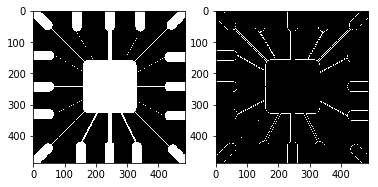

In [8]:
testLineDetection('Fig1005(a)(wirebond_mask).tif')

这里检测的结果，pycharm和jupyter notebook，还有书上给的图不大一样，我猜测是编译器的问题

尝试使用不同的模板进行滤波，不同的模板对于不同方向的线，有不同的反应，改造testLineDetection方法如下：

In [9]:
def testLineDetection(name, kernel= laplaceKernel):
    img = cv.imread(filePath + name, 0)

    result = filterProcess(img, kernel)
    #    result = cv.Laplacian(img, -1,ksize=3,scale=1, delta=0, borderType=cv.BORDER_DEFAULT)
    plt.subplot(1, 2, 1)
    plt.imshow(img, cmap='gray')
    plt.subplot(1, 2, 2)
    plt.imshow(result, cmap='gray')

    plt.show()

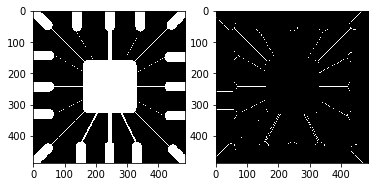

In [10]:
levelKernel = np.array([[-1,-1,-1],
                          [2,2,2],
                          [-1,-1,-1]])
testLineDetection('Fig1005(a)(wirebond_mask).tif', kernel= levelKernel)

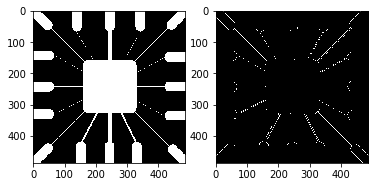

In [11]:
FortyFiveDegreeKernel = np.array([[2,-1,-1],
                          [-1,2,-1],
                          [-1,-1,2]])
testLineDetection('Fig1005(a)(wirebond_mask).tif', kernel= FortyFiveDegreeKernel)

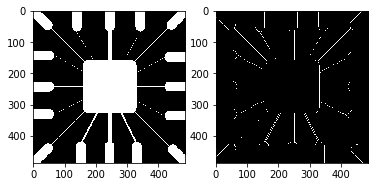

In [12]:
verticalKernel = np.array([[-1,2,-1],
                          [-1,2,-1],
                          [-1,2,-1]])
testLineDetection('Fig1005(a)(wirebond_mask).tif', kernel= verticalKernel)

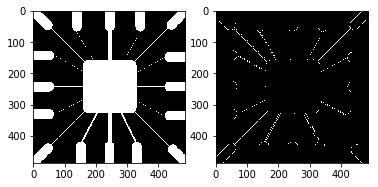

In [13]:
negativeFortyFiveDegreeKernel = np.array([[-1,-1,2],
                          [-1,2,-1],
                          [2,-1,-1]])
testLineDetection('Fig1005(a)(wirebond_mask).tif', kernel= negativeFortyFiveDegreeKernel)

#### 边缘检测

In [14]:
prewittXKernel = np.array([[-1,-1,-1],
                           [0,0,0],
                           [1,1,1]])
prewittYKernel = np.array([[-1,0,1],
                           [-1,0,1],
                           [-1,0,1]])

In [15]:
def testPrewittFilter(name):
    img = cv.imread(filePath+name,0)

    (height, width) = img.shape
    print(img.shape)
    preX = filterProcess(img, prewittXKernel)
    preY = filterProcess(img, prewittYKernel)

    preImg = preX + preY
    plt.figure(figsize=(width/100*4, height/100*4))
    plt.subplot(1,4,1)
    plt.title('origin')
    plt.imshow(img, cmap='gray')

    plt.subplot(1,4,2)
    plt.title('gradX')
    plt.imshow(preX, cmap='gray')

    plt.subplot(1,4,3)
    plt.title('gradY')
    plt.imshow(preY, cmap='gray')

    plt.subplot(1,4,4)
    plt.title('gx+gy')
    plt.imshow(preImg, cmap='gray')

    plt.show()

(834, 1114)


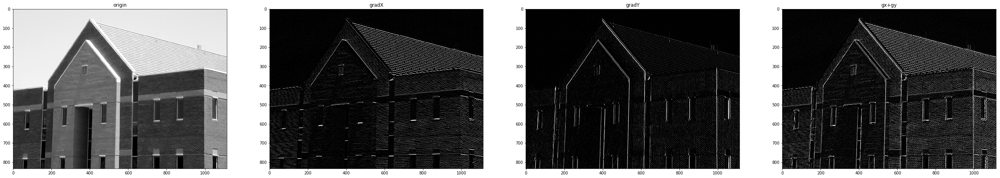

In [16]:
testPrewittFilter('Fig1016(a)(building_original).tif')

这里用prewitt模板求梯度，来检测边缘，最开始显示图像的时候，发现opencv.imshow和plt.imshow显示的结果不同，plt的会很模糊，后来发现是因为没有设置展示图片的大小导致的，图像经过放缩，所以很糊，这里将展示的图像设置为原图X4，大概能展示出一个比较好的结果，其实考虑到用设置大小的其实是plt生成的png图像，其实可以设置的更大写，包含图片中白色间隙等部分的大小应该效果会更好。

Sobel算子进行边缘检测，这里改造上面的prewittFilter函数，使之成为更通用的方法

In [18]:
sobelXKernel = np.array([[-1,-2,-1],
                           [0,0,0],
                           [1,2,1]])
sobelYKernel = np.array([[-1,0,1],
                           [-2,0,2],
                           [-1,0,1]])

In [19]:
def testGradFilter(name, kernelX=sobelXKernel, kernelY=sobelYKernel):
    img = cv.imread(filePath+name,0)

    (height, width) = img.shape
    preX = filterProcess(img, kernelX)
    preY = filterProcess(img, kernelY)

    preImg = preX + preY
    plt.figure(figsize=(width/100*4, height/100*4))
    plt.subplot(1,4,1)
    plt.title('origin')
    plt.imshow(img, cmap='gray')

    plt.subplot(1,4,2)
    plt.title('gradX')
    plt.imshow(preX, cmap='gray')

    plt.subplot(1,4,3)
    plt.title('gradY')
    plt.imshow(preY, cmap='gray')

    plt.subplot(1,4,4)
    plt.title('gx+gy')
    plt.imshow(preImg, cmap='gray')

    plt.show()

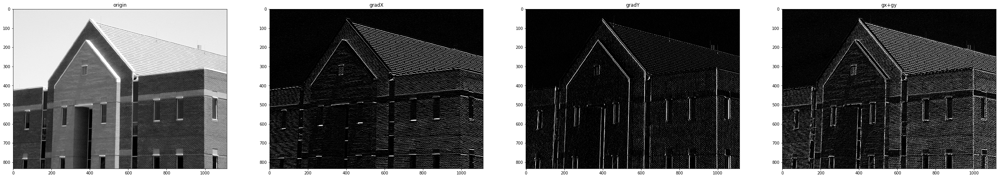

In [20]:
testGradFilter('Fig1016(a)(building_original).tif', kernelX=sobelXKernel, kernelY=sobelYKernel)

使用prewitt和sobel对角模板，使其沿对角线方向有最大响应

In [21]:
prewittXDiaKernel = np.array([[0,1,1],
                           [-1,0,1],
                           [-1,-1,0]])
prewittYDiaKernel = np.array([[-1,-1,0],
                           [-1,0,1],
                           [0,1,1]])
sobelXDiagKernel = np.array([[0,1,2],
                           [-1,0,1],
                           [-2,-1,0]])
sobelYDiagKernel = np.array([[-2,-1,0],
                           [-1,0,1],
                           [0,1,2]])

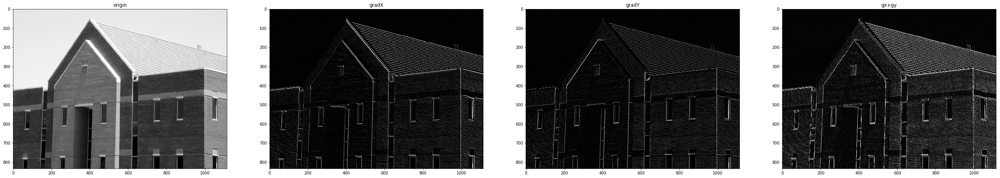

In [22]:
testGradFilter('Fig1016(a)(building_original).tif', kernelX=prewittXDiaKernel, kernelY=prewittYDiaKernel)

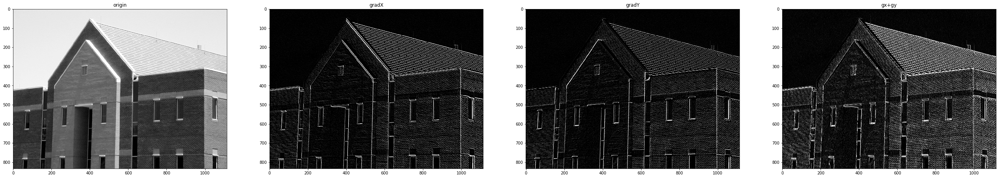

In [23]:
testGradFilter('Fig1016(a)(building_original).tif', kernelX=sobelXDiagKernel, kernelY=sobelYDiagKernel)

为了减少墙砖对与图片的影响，减小噪声，先使用5X5的均值滤波器进行平滑，再检测边缘

In [25]:
def gradDetection(img, kernelX=sobelXKernel, kernelY=sobelYKernel):
    (height, width) = img.shape
    preX = filterProcess(img, kernelX)
    preY = filterProcess(img, kernelY)

    preImg = preX + preY
    plt.figure(figsize=(width/100*4, height/100*4))
    plt.subplot(1,4,1)
    plt.title('origin')
    plt.imshow(img, cmap='gray')

    plt.subplot(1,4,2)
    plt.title('gradX')
    plt.imshow(preX, cmap='gray')

    plt.subplot(1,4,3)
    plt.title('gradY')
    plt.imshow(preY, cmap='gray')

    plt.subplot(1,4,4)
    plt.title('gx+gy')
    plt.imshow(preImg, cmap='gray')

    plt.show()

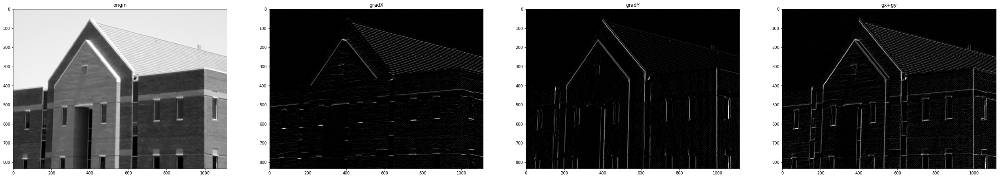

In [28]:
houseImg = cv.imread(filePath+'Fig1016(a)(building_original).tif',0)
blurImg = cv.blur(houseImg, (5,5))
gradDetection(blurImg, prewittXKernel, prewittYKernel)

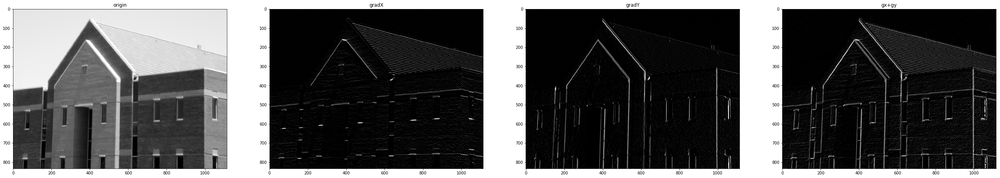

In [29]:
gradDetection(blurImg, sobelXKernel, sobelYKernel)

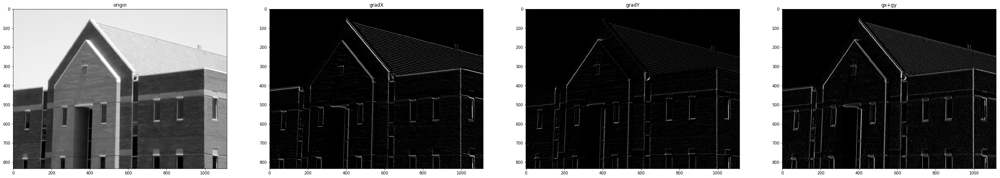

In [30]:
gradDetection(blurImg, prewittXDiaKernel, prewittYDiaKernel)

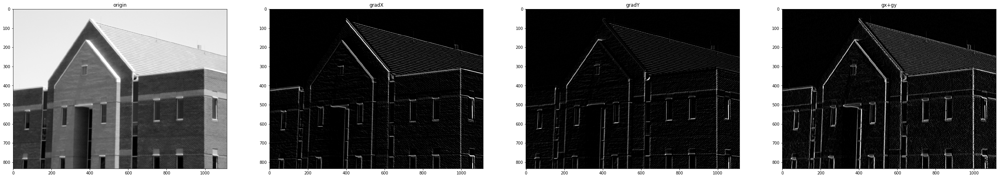

In [31]:
gradDetection(blurImg, sobelXDiagKernel, sobelYDiagKernel)

可以看到由于使用了均值滤波器平滑图像，砖块的影响被大大减小

#### 结合阈值处理，检测边缘

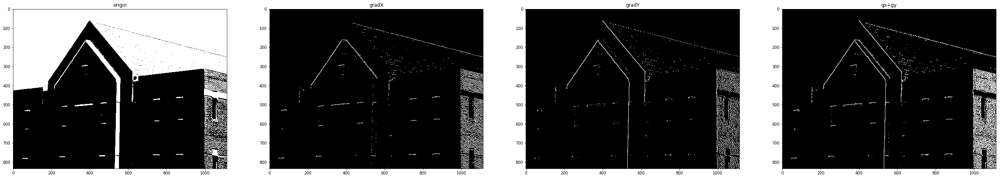

In [32]:
ret, thImg = cv.threshold(houseImg, 150, 255, cv.THRESH_OTSU)
gradDetection(thImg, prewittXKernel, prewittYKernel)

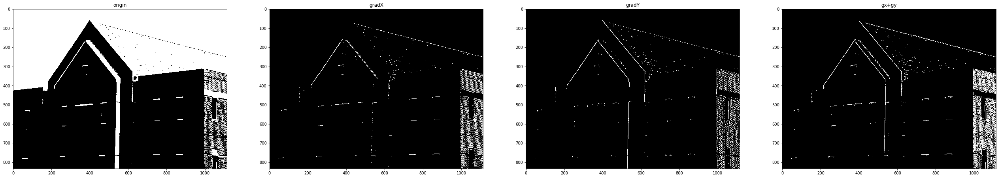

In [33]:
gradDetection(thImg, sobelXKernel, sobelYKernel)

使用OTSU模式来自动计算阈值的话，右边去墙壁的瓷砖，会被明显检测出来，尝试对平滑过的图像进行二值化，然后检测边缘

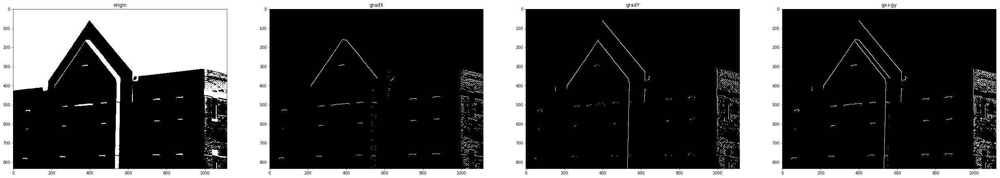

In [34]:
ret2, thBlurImg = cv.threshold(blurImg, 150, 255, cv.THRESH_OTSU)
gradDetection(thBlurImg, prewittXKernel, prewittYKernel)

可以看到，效果依旧不理想，屋顶上的边缘由于平滑处理，已经不能显示出来了

尝试手动选择阈值，选择图像最大值的0.33最为阈值

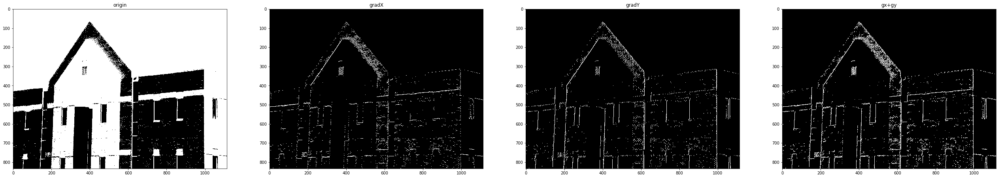

In [37]:
maxValue = np.max(houseImg)
ret, thImg = cv.threshold(houseImg, 0.33*maxValue, 255, cv.THRESH_BINARY)
gradDetection(thImg, prewittXKernel, prewittYKernel)

发现有些边缘由于二值化处理直接被抹去，导致边缘检测的效果并不是太好

### 更先进的边缘检测技术

#### Marr-Hildreth

Marr-Hildreth边缘检测算法：
1. 用一个n\*n的高斯低通滤波器对输入图像滤波
2. 计算上一步得到图像的拉普拉斯变换
3. 检测二阶导零交叉点并对应于一阶导数的较大峰值

可以将第一步和第二步合起来计算，使用一个大小为n\*n的LoG离散滤波器，其n值是大于等于高斯函数中6\*sigma（均值）的最小奇整数。
n小于上面说的值时，模板会截断LoG函数，截断程度与模板大小成反比；使用较大的模板则影响不大。

In [39]:
def edgesMarrHildreth(img, sigma):

    size = int(2 * (np.ceil(3 * sigma)) + 1)
    print('size='+str(size))

    x, y = np.meshgrid(np.arange(-size / 2 + 1, size / 2 + 1), np.arange(-size / 2 + 1, size / 2 + 1))

    normal = 1 / (2.0 * np.pi * sigma ** 2)

    kernel = ((x ** 2 + y ** 2 - (2.0 * sigma ** 2)) / sigma ** 4) * np.exp(
        -(x ** 2 + y ** 2) / (2.0 * sigma ** 2)) / normal  # LoG filter

    kern_size = kernel.shape[0]
    log = np.zeros_like(img, dtype=float)

    # applying filter
    for i in range(img.shape[0] - (kern_size - 1)):
        for j in range(img.shape[1] - (kern_size - 1)):
            window = img[i:i + kern_size, j:j + kern_size] * kernel
            log[i, j] = np.sum(window)

    log = log.astype(np.int64, copy=False)

    zero_crossing = np.zeros_like(log)

    # computing zero crossing
    for i in range(log.shape[0] - (kern_size - 1)):
        for j in range(log.shape[1] - (kern_size - 1)):
            if log[i][j] == 0:
                if (log[i][j - 1] < 0 and log[i][j + 1] > 0) or (log[i][j - 1] < 0 and log[i][j + 1] < 0) or (
                        log[i - 1][j] < 0 and log[i + 1][j] > 0) or (log[i - 1][j] > 0 and log[i + 1][j] < 0):
                    zero_crossing[i][j] = 255
            if log[i][j] < 0:
                if (log[i][j - 1] > 0) or (log[i][j + 1] > 0) or (log[i - 1][j] > 0) or (log[i + 1][j] > 0):
                    zero_crossing[i][j] = 255

                # plotting images
    fig = plt.figure()
    a = fig.add_subplot(1, 2, 1)
    imgplot = plt.imshow(log, cmap='gray')
    a.set_title('Laplacian of Gaussian')
    a = fig.add_subplot(1, 2, 2)
    imgplot = plt.imshow(zero_crossing, cmap='gray')
    string = 'Zero Crossing sigma = '
    string += (str(sigma))
    a.set_title(string)
    plt.show()

    return zero_crossing

上面的size即计算的n值，LoG模板的计算参考了网上的代码，最后进行滤波，找到零交叉点，以lena图为例，得到的边缘检测图片如下：

size=25


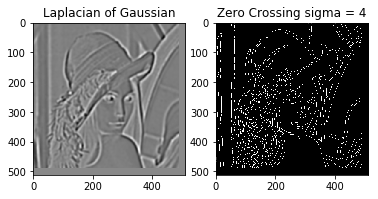

In [40]:
lenaImg = cv.imread(filePath+'lena_std.tif',0)
result = edgesMarrHildreth(lenaImg, sigma=4)

#### Canny边缘检测

Canny边缘检测算法：
1. 用高斯滤波器平滑输入图像
2. 计算梯度幅值图像和角度图像
3. 对梯度幅值图像应用非极大值抑制
4. 用双阈值处理和连接分析来检测并连接边缘

高斯模糊
这里直接使用opencv自带的高斯模糊函数，在之前的实验中我也自己实现过高斯模糊，但是需要给出高斯矩阵的标准差，因此这里直接使用opencv自带的，在标准差参数为0时，可以根据高斯矩阵的尺寸自己计算。

In [53]:
def testGauss(size=(5,5), sigma=0):
    lenaImg = cv.imread(filePath+'lena_std.tif',0)
    gaussLena = cv.GaussianBlur(lenaImg, size,sigma)
    plt.title("testGauss")
    plt.imshow(gaussLena, cmap='gray')
    plt.show()

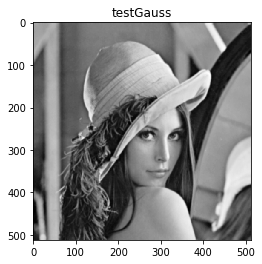

In [54]:
testGauss()

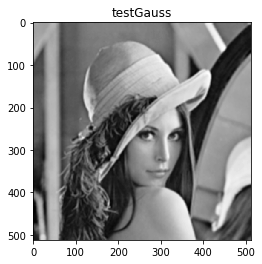

In [57]:
testGauss((5,5), 100)

这里看上去，似乎sigma=100和0时没有差别，实际上我在pycharm中实验时，无论是0还是100，相对于原图都模糊了许多，标准差越大越模糊，这里是因为展示的图片太小了，看不出效果。

计算梯度幅值和方向，使用sobel算子 

In [68]:
def computeGradSobel(img):
    Gx = cv.Sobel(img,-1,1,0,ksize=3)
    Gy = cv.Sobel(img, -1,0,1,ksize=3)
    G = np.sqrt(np.square(Gx.astype(np.float64)) + np.square(Gy.astype(np.float64)))
    cita = np.arctan2(Gy.astype(np.float64), Gx.astype(np.float64))
    
    return Gx,Gy,G,cita

def testGradSobel(img):
    Gx, Gy, G, cita = computeGradSobel(img)

    fig = plt.figure()
    a = fig.add_subplot(1, 3, 1)
    imgplot = plt.imshow(Gx, cmap='gray')
    a.set_title('Sobel X')
    a = fig.add_subplot(1, 3, 2)
    imgplot = plt.imshow(Gy, cmap='gray')
    a.set_title('Sobel Y')
    a = fig.add_subplot(1, 3, 3)
    imgplot = plt.imshow(G, cmap='gray')
    a.set_title('Sobel')
    plt.show()

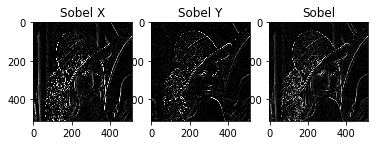

In [69]:
testGradSobel(lenaImg)

非极大值抑制：
比较当前点的梯度强度和正负梯度方向点的梯度强度，如果当前点的梯度强度和同方向的其他点的梯度强度相比较是最大，保留其值。否则抑制，即设为0。

In [ ]:
def NonmaximumSuppression(image,cita):
    keep = np.zeros(cita.shape)
    cita = np.abs(cv2.copyMakeBorder(cita,1,1,1,1,cv2.BORDER_DEFAULT))
    for i in range(1,cita.shape[0]-1):
        for j in range(1,cita.shape[1]-1):
            if cita[i][j]>cita[i-1][j] and cita[i][j]>cita[i+1][j]:
                keep[i-1][j-1] = 1
            elif cita[i][j]>cita[i][j+1] and cita[i][j]>cita[i][j-1]:
                keep[i-1][j-1] = 1
            elif cita[i][j]>cita[i+1][j+1] and cita[i][j]>cita[i-1][j-1]:
                keep[i-1][j-1] = 1
            elif cita[i][j]>cita[i-1][j+1] and cita[i][j]>cita[i+1][j-1]:
                keep[i-1][j-1] = 1
            else:
                keep[i-1][j-1] = 0
    return keep*image